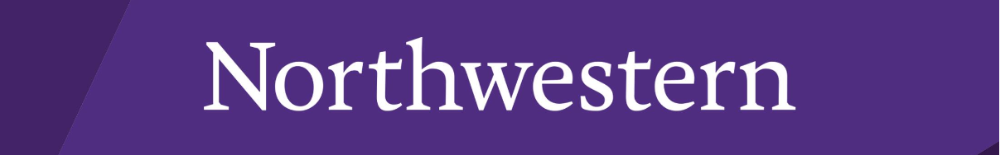

#Attention Encoder (Inceptionv3) & Decoder Model

##Import packages

In [ ]:
#Ignore Warning
import warnings
warnings.filterwarnings("ignore") 
# set up notebook to display multiple outputs in one cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [ ]:
import datetime
from packaging import version
import tarfile
from collections import Counter
import numpy as np
import pandas as pd
import time
import string
import os # Operation System
from tqdm import tqdm
import re
from PIL import Image
import pickle

from timeit import default_timer as timer
import time
from datetime import timedelta

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

import cv2
from google.colab.patches import cv2_imshow

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import accuracy_score


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import TextVectorization
from tensorflow.keras.applications import densenet
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras.preprocessing.text import Tokenizer
from nltk.translate.bleu_score import sentence_bleu
from tensorflow.keras.preprocessing.sequence import pad_sequences
import nltk

## Verify TensorFlow version and Keras version

In [ ]:
print("This notebook requires TensorFlow 2.0 or above")
print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >=2
print("Keras version: ", keras.__version__)

This notebook requires TensorFlow 2.0 or above
TensorFlow version:  2.8.2
Keras version:  2.8.0


## Mount Google Drive to Colab environment

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd /content/gdrive/My Drive/MSDS/458-ANN/Assignment 4/
!pwd
#!ls
print('Working Directory')
print(os.getcwd())
work_dir = "/content/gdrive/My Drive/MSDS/458-ANN/Assignment 4/"

/content/gdrive/My Drive/MSDS/458-ANN/Assignment 4
/content/gdrive/My Drive/MSDS/458-ANN/Assignment 4
Working Directory
/content/gdrive/My Drive/MSDS/458-ANN/Assignment 4


## Utility Functions

In [ ]:
# Learning curve function to visualize accuracy and loss in train and validation set.
def draw_learning_curve(history, keys=['accuracy', 'loss']):
    plt.figure(figsize=(20,8))
    for i, key in enumerate(keys):
        plt.subplot(1, 2, i + 1)
        sns.lineplot(x = history.epoch, y = history.history[key])
        sns.lineplot(x = history.epoch, y = history.history['val_' + key])
        plt.title('Learning Curve')
        plt.ylabel(key.title())
        plt.xlabel('Epoch')
        plt.legend(['train', 'validation'], loc='best')
    plt.show()

In [ ]:
train_data = pd.read_pickle(work_dir + 'pickle_files/train.pkl')
val_data = pd.read_pickle(work_dir + 'pickle_files/val.pkl')
test_data = pd.read_pickle(work_dir + 'pickle_files/test.pkl')

In [ ]:
train_data.shape

(3605, 8)

In [ ]:
val_data.shape

(471, 8)

In [ ]:
test_data.shape

(563, 8)

In [ ]:
train_data.head()

,impression,image_1,image_2,xml file name,impression_final,impression_ip,impression_op,impression_counts
0,no acute cardiopulmonary findings .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,11.xml,<CLS> no acute cardiopulmonary findings . <END>,<CLS> no acute cardiopulmonary findings .,no acute cardiopulmonary findings . <END>,162
1,no acute cardiopulmonary abnormality .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,324.xml,<CLS> no acute cardiopulmonary abnormality . <...,<CLS> no acute cardiopulmonary abnormality .,no acute cardiopulmonary abnormality . <END>,367
2,no acute cardiopulmonary abnormality .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,504.xml,<CLS> no acute cardiopulmonary abnormality . <...,<CLS> no acute cardiopulmonary abnormality .,no acute cardiopulmonary abnormality . <END>,367
3,no acute cardiopulmonary abnormalities .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2539.xml,<CLS> no acute cardiopulmonary abnormalities ....,<CLS> no acute cardiopulmonary abnormalities .,no acute cardiopulmonary abnormalities . <END>,134
4,no acute cardiopulmonary disease .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2061.xml,<CLS> no acute cardiopulmonary disease . <END>,<CLS> no acute cardiopulmonary disease .,no acute cardiopulmonary disease . <END>,136


In [ ]:
val_data.head()

,impression,image_1,image_2,xml file name,impression_final,impression_ip,impression_op,impression_counts
0,no acute cardiopulmonary process .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2192.xml,<CLS> no acute cardiopulmonary process . <END>,<CLS> no acute cardiopulmonary process .,no acute cardiopulmonary process . <END>,87
1,no acute cardiopulmonary abnormalities .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2792.xml,<CLS> no acute cardiopulmonary abnormalities ....,<CLS> no acute cardiopulmonary abnormalities .,no acute cardiopulmonary abnormalities . <END>,134
2,no active disease .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,3701.xml,<CLS> no active disease . <END>,<CLS> no active disease .,no active disease . <END>,130
3,no acute disease .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,1903.xml,<CLS> no acute disease . <END>,<CLS> no acute disease .,no acute disease . <END>,109
4,no acute cardiopulmonary findings .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,3838.xml,<CLS> no acute cardiopulmonary findings . <END>,<CLS> no acute cardiopulmonary findings .,no acute cardiopulmonary findings . <END>,162


In [ ]:
test_data.head()

,impression,image_1,image_2,xml file name,impression_final,impression_ip,impression_op,impression_counts
0,no acute radiographic cardiopulmonary process .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,356.xml,<CLS> no acute radiographic cardiopulmonary pr...,<CLS> no acute radiographic cardiopulmonary pr...,no acute radiographic cardiopulmonary process ...,83
1,no acute cardiopulmonary abnormality .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2290.xml,<CLS> no acute cardiopulmonary abnormality . <...,<CLS> no acute cardiopulmonary abnormality .,no acute cardiopulmonary abnormality . <END>,367
2,no acute pulmonary disease .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,2979.xml,<CLS> no acute pulmonary disease . <END>,<CLS> no acute pulmonary disease .,no acute pulmonary disease . <END>,58
3,no acute findings,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,1531.xml,<CLS> no acute findings <END>,<CLS> no acute findings,no acute findings <END>,30
4,negative for acute abnormality .,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,/content/gdrive/My Drive/MSDS/458-ANN/Assignme...,1347.xml,<CLS> negative for acute abnormality . <END>,<CLS> negative for acute abnormality .,negative for acute abnormality . <END>,30


In [ ]:
#tokenizer
tokenizer = Tokenizer(filters = '',oov_token = '<unk>') #setting filters to none
tokenizer.fit_on_texts(train_data.impression_final.values)
train_captions = tokenizer.texts_to_sequences(train_data.impression_final) 
test_captions = tokenizer.texts_to_sequences(test_data.impression_final) 
vocab_size = len(tokenizer.word_index)
caption_len = np.array([len(i) for i in train_captions])
start_index = tokenizer.word_index['<cls>'] #tokened value of <start>
end_index = tokenizer.word_index['<end>'] #tokened value of <end>

print('\nThe max and min value of "caption length" was found to be %i and %i respectively'%(max(caption_len),min(caption_len)))
print('The 80 percentile value of caption_len which is %i will be taken as the maximum padded value for each impression for faster training.'
%(np.percentile(caption_len,80)))
max_pad = int(np.percentile(caption_len,80))
del train_captions,test_captions #we will create tokenizing  and padding in-built in dataloader


The max and min value of "caption length" was found to be 135 and 3 respectively
The 80 percentile value of caption_len which is 30 will be taken as the maximum padded value for each impression for faster training.


##Modeling

Model architecture consists of three models:

1. A CNN: used to extract the image features
2. Encoder: The extracted image features are then passed to a Transformer.
3. Decoder: This model takes the encoder output and the text data.

In [ ]:
batch_size = 100
embedding_dim = 300
dense_dim = 512
lstm_units = dense_dim
dropout_rate = 0.2

In [ ]:
import imgaug.augmenters as iaa

In [ ]:
class Dataset():
  #here we will get the images converted to vector form and the corresponding captions
  def __init__(self,df,input_size,tokenizer = tokenizer, augmentation = True,max_pad = max_pad): 
    """
    df  = dataframe containing image_1,image_2 and impression
    """
    self.image1 = df.image_1
    self.image2 = df.image_2
    self.caption = df.impression_ip #inp
    self.caption1 = df.impression_op  #output
    self.input_size = input_size #tuple ex: (512,512)
    self.tokenizer = tokenizer
    self.augmentation = augmentation
    self.max_pad = max_pad

    # self.aug1 = keras.preprocessing.image.ImageDataGenerator(horizontal_flip=True)
    # self.aug2 = keras.preprocessing.image.ImageDataGenerator(vertical_flip=True)
    #image augmentation
    #https://imgaug.readthedocs.io/en/latest/source/overview/flip.html?highlight=Fliplr
    self.aug1 = iaa.Fliplr(1) #flip images horizontally
    self.aug2 = iaa.Flipud(1) #flip images vertically



    # https://imgaug.readthedocs.io/en/latest/source/overview/convolutional.html?highlight=emboss#emboss
    # self.aug3 = iaa.Emboss(alpha=(1), strength=1) #embosses image

    # #https://imgaug.readthedocs.io/en/latest/source/api_augmenters_convolutional.html?highlight=sharpen#imgaug.augmenters.convolutional.Sharpen
    # self.aug4 = iaa.Sharpen(alpha=(1.0), lightness=(1.5)) #sharpens the image and apply some lightness/brighteness 1 means fully sharpened etc

  def __getitem__(self,i):
    #gets the datapoint at i th index, we will extract the feature vectors of images after resizing the image  and apply augmentation
    image1 = cv2.imread(self.image1[i],cv2.IMREAD_UNCHANGED)/255 
    image2 = cv2.imread(self.image2[i],cv2.IMREAD_UNCHANGED)/255 #here there are 3 channels
    image1 = cv2.resize(image1,self.input_size,interpolation = cv2.INTER_NEAREST)
    image2 = cv2.resize(image2,self.input_size,interpolation = cv2.INTER_NEAREST)
    if image1.any()==None:
      print("%i , %s image sent null value"%(i,self.image1[i]))
    if image2.any()==None:
      print("%i , %s image sent null value"%(i,self.image2[i]))


    #tokenizing and padding
    caption = self.tokenizer.texts_to_sequences(self.caption[i:i+1]) #the input should be an array for tokenizer ie [self.caption[i]] 

    caption = pad_sequences(caption,maxlen = self.max_pad,padding = 'post') #opshape:(input_length,)
    caption = tf.squeeze(caption,axis=0) #opshape = (input_length,) removing unwanted axis if present

    caption1 = self.tokenizer.texts_to_sequences(self.caption1[i:i+1]) #the input should be an array for tokenizer ie [self.caption[i]] 

    caption1 = pad_sequences(caption1,maxlen = self.max_pad,padding = 'post') #opshape: (input_length,)
    caption1 = tf.squeeze(caption1,axis=0) #opshape = (input_length,) removing unwanted axis if present




    if self.augmentation: #we will not apply augmentation that crops the image 
          a = np.random.uniform()
          if a<0.333:
              image1 = self.aug1.augment_image(image1)
              image2 = self.aug1.augment_image(image2)
          elif a<0.667:
              image1 = self.aug2.augment_image(image1)
              image2 = self.aug2.augment_image(image2)
          else: #applying no augmentation
            pass;

    
    return image1,image2,caption,caption1

    
  def __len__(self):
    return len(self.image1)


class Dataloader(tf.keras.utils.Sequence):     #for batching
    def __init__(self, dataset, batch_size=1, shuffle=True):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(self.dataset))

    def __getitem__(self, i):
        
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        indexes = [self.indexes[j] for j in range(start,stop)] #getting the shuffled index values
        data = [self.dataset[j] for j in indexes] #taken from Data class (calls __getitem__ of Data) here the shape is batch_size*3, (image_1,image_2,caption)
        
        batch = [np.stack(samples, axis=0) for samples in zip(*data)] #here the shape will become batch_size*input_size(of image)*3,batch_size*input_size(of image)*3
                                                                      #,batch_size*1*max_pad


        return tuple([[batch[0],batch[1],batch[2]],batch[3]]) #here [image1,image2, caption(without <END>)],caption(without <START>) (op)
    
    def __len__(self): #returns total number of batches in an epoch
        return len(self.indexes) // self.batch_size
    
    def on_batch_end(self): #it runs at the end of epoch
        if self.shuffle:
            np.random.shuffle(self.indexes) #in-place shuffling takes place

In [ ]:
input_size = (224,224)

train_dataloader = Dataset(train_data,input_size)
train_dataloader = Dataloader(train_dataloader,batch_size = batch_size)

val_dataloader = Dataset(val_data,input_size)
val_dataloader = Dataloader(val_dataloader,batch_size = batch_size)

test_dataloader = Dataset(test_data,input_size)
test_dataloader = Dataloader(test_dataloader,batch_size = batch_size)

##Inceptionv3 Model

In [ ]:
def create_inceptionv3(input_size = input_size):

  model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet', input_shape = input_size+(3,)) #importing InceptionV3 the last layer will be a relu activation layer

  x = model.output #output from InceptionV3
  x = keras.layers.GlobalAveragePooling2D()(x)
  x = keras.layers.Dense(14, activation="sigmoid", name="chexnet_output")(x) #here activation is sigmoid as seen in research paper

  inception_layers = tf.keras.Model(inputs = model.input,outputs = x)
  inception = tf.keras.Model(inputs = model.input,outputs = inception_layers.layers[-3].output)  #we will be taking the 3rd last layer (here it is layer before global avgpooling)
  #since we are using attention here
  return inception

In [ ]:
class Image_encoder(tf.keras.layers.Layer):
  """
  This layer will output image backbone features after passing it through chexnet
  here chexnet will be not be trainable
  """
  def __init__(self,
               name = "image_encoder_block"
               ):
    super().__init__()
    self.incepton = create_inceptionv3()
    self.incepton.trainable = False
    self.avgpool = tf.keras.layers.AveragePooling2D()
    # for i in range(10): #the last 10 layers of chexnet will be trained
    #   self.chexnet.layers[-i].trainable = True
    
  def call(self,data):
    op = self.incepton(data) #op shape: (None,7,7,1024)
    op = self.avgpool(op) #op shape (None,3,3,1024)
    op = tf.reshape(op,shape = (-1,op.shape[1]*op.shape[2],op.shape[3])) #op shape: (None,9,1024)
    return op 

## Attention Model

In [ ]:
embedding_dim = 300
dense_dim = 512
lstm_units = dense_dim
dropout_rate = 0.2

In [ ]:
def encoder(image1,image2,dense_dim = dense_dim,dropout_rate = dropout_rate):
  """
  Takes image1,image2
  gets the final encoded vector of these
  """
  #image1
  im_encoder = Image_encoder()
  bkfeat1 = im_encoder(image1) #shape: (None,9,1024)
  bk_dense = tf.keras.layers.Dense(dense_dim,name = 'bkdense',activation = 'relu', kernel_regularizer=tf.keras.regularizers.L2(0.001)) #shape: (None,9,512)
  bkfeat1 = bk_dense(bkfeat1)

  #image2
  bkfeat2 = im_encoder(image2) #shape: (None,9,1024)
  bkfeat2 = bk_dense(bkfeat2) #shape: (None,9,512)


  #combining image1 and image2
  concat = tf.keras.layers.Concatenate(axis=1)([bkfeat1,bkfeat2]) #concatenating through the second axis shape: (None,18,1024)
  bn = tf.keras.layers.BatchNormalization(name = "encoder_batch_norm")(concat) 
  dropout = tf.keras.layers.Dropout(dropout_rate,name = "encoder_dropout")(bn)
  return dropout

### Global Attention Layer

In [ ]:
class global_attention(tf.keras.layers.Layer):
  """
  calculate global attention
  """
  def __init__(self,dense_dim = dense_dim):
    super().__init__()
    # Intialize variables needed for Concat score function here
    self.W1 = tf.keras.layers.Dense(units = dense_dim) #weight matrix of shape enc_units*dense_dim
    self.W2 = tf.keras.layers.Dense(units = dense_dim) #weight matrix of shape dec_units*dense_dim
    self.V = tf.keras.layers.Dense(units = 1) #weight matrix of shape dense_dim*1 
      #op (None,98,1)


  def call(self,encoder_output,decoder_h): #here the encoded output will be the concatted image bk features shape: (None,98,dense_dim)
    decoder_h = tf.expand_dims(decoder_h,axis=1) #shape: (None,1,dense_dim)
    tanh_input = self.W1(encoder_output) + self.W2(decoder_h) #ouput_shape: batch_size*98*dense_dim
    tanh_output =  tf.nn.tanh(tanh_input)
    attention_weights = tf.nn.softmax(self.V(tanh_output),axis=1) #shape= batch_size*98*1 getting attention alphas
    op = attention_weights*encoder_output#op_shape: batch_size*98*dense_dim  multiply all aplhas with corresponding context vector
    context_vector = tf.reduce_sum(op,axis=1) #summing all context vector over the time period ie input length, output_shape: batch_size*dense_dim


    return context_vector,attention_weights

In [ ]:
glove = {}
with open(work_dir +'glove.6B.300d.txt',encoding='utf-8') as f: #taking 300 dimesions
  for line in f:
    word = line.split() #it is stored as string like this "'the': '.418 0.24968 -0.41242 0.1217 0.34527 -0.044457 -0.4"
    glove[word[0]] = np.asarray(word[1:], dtype='float32')


embedding_dim = 300
# create a weight matrix for words in training docs for embedding purpose
embedding_matrix = np.zeros((vocab_size+1, embedding_dim)) #https://www.tensorflow.org/api_docs/python/tf/keras/layers/Embedding

for word, i in tokenizer.word_index.items():
  embedding_vector = glove.get(word)
  if embedding_vector is not None: #if the word is found in glove vectors
      embedding_matrix[i] = embedding_vector[:embedding_dim]

### One Step Decoder

In [ ]:
class One_Step_Decoder(tf.keras.layers.Layer):
  """
  decodes a single token
  """
  def __init__(self,vocab_size = vocab_size, embedding_dim = embedding_dim, max_pad = max_pad, dense_dim = dense_dim ,name = "onestepdecoder"):
    # Initialize decoder embedding layer, LSTM and any other objects needed
    super().__init__()
    self.dense_dim = dense_dim
    self.embedding = tf.keras.layers.Embedding(input_dim = vocab_size+1,
                                output_dim = embedding_dim,
                                input_length=max_pad,
                                weights = [embedding_matrix],
                                mask_zero=True, 
                                name = 'onestepdecoder_embedding'
                              )
    self.LSTM = tf.keras.layers.GRU(units=self.dense_dim,
                    #return_sequences=True,
                    return_state=True,
                    kernel_initializer=tf.keras.initializers.glorot_uniform(seed=23),
                    recurrent_initializer=tf.keras.initializers.orthogonal(seed=7),
                    name = 'onestepdecoder_LSTM'
                    )
    self.attention = global_attention(dense_dim = dense_dim)
    self.concat = tf.keras.layers.Concatenate(axis=-1)
    self.dense = tf.keras.layers.Dense(dense_dim,name = 'onestepdecoder_embedding_dense',activation = 'relu')
    self.final = tf.keras.layers.Dense(vocab_size+1,activation='softmax')
    self.concat = tf.keras.layers.Concatenate(axis=-1)
    self.add = tf.keras.layers.Add()
  @tf.function
  def call(self,input_to_decoder, encoder_output, decoder_h):#,decoder_c):
    '''
        One step decoder mechanisim step by step:
      A. Pass the input_to_decoder to the embedding layer and then get the output(batch_size,1,embedding_dim)
      B. Using the encoder_output and decoder hidden state, compute the context vector.
      C. Concat the context vector with the step A output
      D. Pass the Step-C output to LSTM/GRU and get the decoder output and states(hidden and cell state)
      E. Pass the decoder output to dense layer(vocab size) and store the result into output.
      F. Return the states from step D, output from Step E, attention weights from Step -B

      here state_h,state_c are decoder states
    '''
    embedding_op = self.embedding(input_to_decoder) #output shape = batch_size*1*embedding_shape (only 1 token)
    

    context_vector,attention_weights = self.attention(encoder_output,decoder_h) #passing hidden state h of decoder and encoder output
    #context_vector shape: batch_size*dense_dim we need to add time dimension
    context_vector_time_axis = tf.expand_dims(context_vector,axis=1)
    #now we will combine attention output context vector with next word input to the lstm here we will be teacher forcing
    concat_input = self.concat([context_vector_time_axis,embedding_op])#output dimension = batch_size*input_length(here it is 1)*(dense_dim+embedding_dim)
    
    output,decoder_h = self.LSTM(concat_input,initial_state = decoder_h)
    #output shape = batch*1*dense_dim and decoder_h,decoder_c has shape = batch*dense_dim
    #we need to remove the time axis from this decoder_output
    

    output = self.final(output)#shape = batch_size*decoder vocab size
    return output,decoder_h,attention_weights

## Decoder

In [ ]:
class decoder(tf.keras.Model):
  """
  Decodes the encoder output and caption
  """
  def __init__(self,max_pad = max_pad, embedding_dim = embedding_dim,dense_dim = dense_dim,score_fun='general',batch_size = batch_size,vocab_size = vocab_size):
    super().__init__()
    self.onestepdecoder = One_Step_Decoder(vocab_size = vocab_size, embedding_dim = embedding_dim, max_pad = max_pad, dense_dim = dense_dim)
    self.output_array = tf.TensorArray(tf.float32,size=max_pad)
    self.max_pad = max_pad
    self.batch_size = batch_size
    self.dense_dim =dense_dim
    
  @tf.function
  def call(self,encoder_output,caption):#,decoder_h,decoder_c): #caption : (None,max_pad), encoder_output: (None,dense_dim)
    decoder_h, decoder_c = tf.zeros_like(encoder_output[:,0]), tf.zeros_like(encoder_output[:,0]) #decoder_h, decoder_c
    output_array = tf.TensorArray(tf.float32,size=max_pad)
    for timestep in range(self.max_pad): #iterating through all timesteps ie through max_pad
      output,decoder_h,attention_weights = self.onestepdecoder(caption[:,timestep:timestep+1], encoder_output, decoder_h)
      output_array = output_array.write(timestep,output) #timestep*batch_size*vocab_size

    self.output_array = tf.transpose(output_array.stack(),[1,0,2]) #.stack :Return the values in the TensorArray as a stacked Tensor.)
        #shape output_array: (batch_size,max_pad,vocab_size)
    return self.output_array

### Global Attention Model

In [ ]:
#model creation
tf.keras.backend.clear_session()
image1 = tf.keras.Input(shape = (input_size + (3,))) #shape = 224,224,3
image2 = tf.keras.Input(shape = (input_size + (3,))) #https://www.w3resource.com/python-exercises/tuple/python-tuple-exercise-5.php
caption = tf.keras.Input(shape = (max_pad,))

encoder_output = encoder(image1,image2) #shape: (None,28,512)

output = decoder()(encoder_output,caption)

model = tf.keras.Model(inputs = [image1,image2,caption], outputs = output)

In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 image_encoder (Image_encoder)  (None, 4, 2048)      21802784    ['input_1[0][0]',                
                                                                  'input_2[0][0]']          

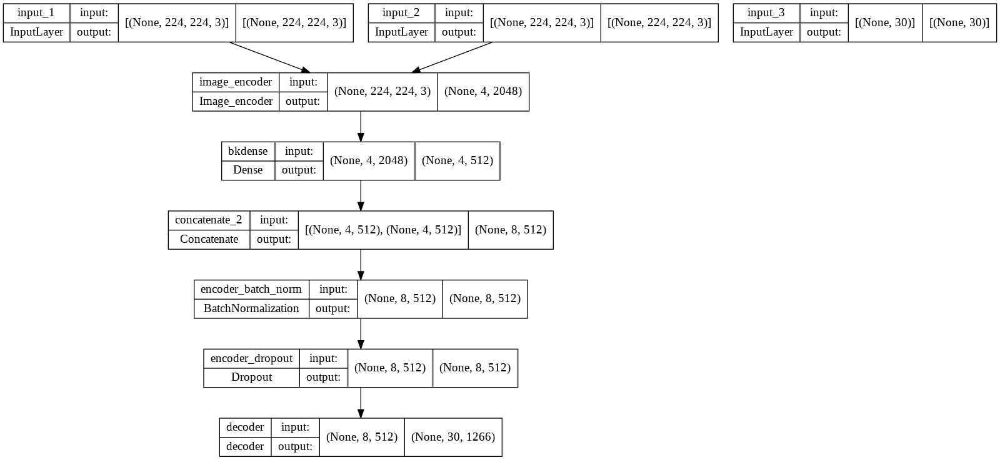

In [ ]:
keras.utils.plot_model(model, "globalAttentionModel.png", show_shapes=True)

In [ ]:
loss_func = tf.keras.losses.SparseCategoricalCrossentropy() 

def custom_loss(y_true, y_pred):
    #getting mask value to not consider those words which are not present in the true caption
    mask = tf.math.logical_not(tf.math.equal(y_true, 0))

    #y_pred = y_pred+10**-7 #to prevent loss becoming null

    #calculating the loss
    loss_ = loss_func(y_true, y_pred)
    
    #converting mask dtype to loss_ dtype
    mask = tf.cast(mask, dtype=loss_.dtype)
    
    #applying the mask to loss
    loss_ = loss_*mask
    
    #returning mean over all the values
    return tf.reduce_mean(loss_)

lr = 10**-2
optimizer = tf.keras.optimizers.Adam()   
model.compile(optimizer=optimizer,loss=custom_loss,metrics= ['accuracy'])

In [ ]:
tf.keras.backend.clear_session()
tb_filename = 'globalIn_attention_inceptonv3_encoder_decoder/'
tb_file = os.path.join(work_dir ,tb_filename)
model_filename = 'global_attention_inceptonv3_encoder_decoder.h5'
model_save = os.path.join(work_dir , model_filename)
my_callbacks = [
    tf.keras.callbacks.EarlyStopping(patience = 5,
                                     verbose = 2
                                     ),
    tf.keras.callbacks.ModelCheckpoint(filepath=model_save,
                                       save_best_only = True,
                                      save_weights_only = True,
                                       verbose = 2
                                       ),
    tf.keras.callbacks.TensorBoard("/tmp/tb_logs/inceptonv3"),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=2, min_lr=10**-7, verbose = 2)
                                   
] #from keras documentation

In [ ]:
history = model.fit(train_dataloader,
          validation_data = val_dataloader,
          epochs = 10,
          callbacks = my_callbacks
          )

Epoch 1/10
36/36 [==============================] - ETA: 0s - loss: 3.8713 - accuracy: 0.4402 
Epoch 1: val_loss improved from inf to 2.60482, saving model to /content/gdrive/My Drive/MSDS/458-ANN/Assignment 4/global_attention_inceptonv3_encoder_decoder.h5
36/36 [==============================] - 749s 20s/step - loss: 3.8713 - accuracy: 0.4402 - val_loss: 2.6048 - val_accuracy: 0.7337 - lr: 0.0010
Epoch 2/10
36/36 [==============================] - ETA: 0s - loss: 3.0630 - accuracy: 0.6218
Epoch 2: val_loss improved from 2.60482 to 2.27822, saving model to /content/gdrive/My Drive/MSDS/458-ANN/Assignment 4/global_attention_inceptonv3_encoder_decoder.h5
36/36 [==============================] - 121s 3s/step - loss: 3.0630 - accuracy: 0.6218 - val_loss: 2.2782 - val_accuracy: 0.7648 - lr: 0.0010
Epoch 3/10
36/36 [==============================] - ETA: 0s - loss: 2.7016 - accuracy: 0.6676
Epoch 3: val_loss did not improve from 2.27822
36/36 [==============================] - 120s 3s/step -

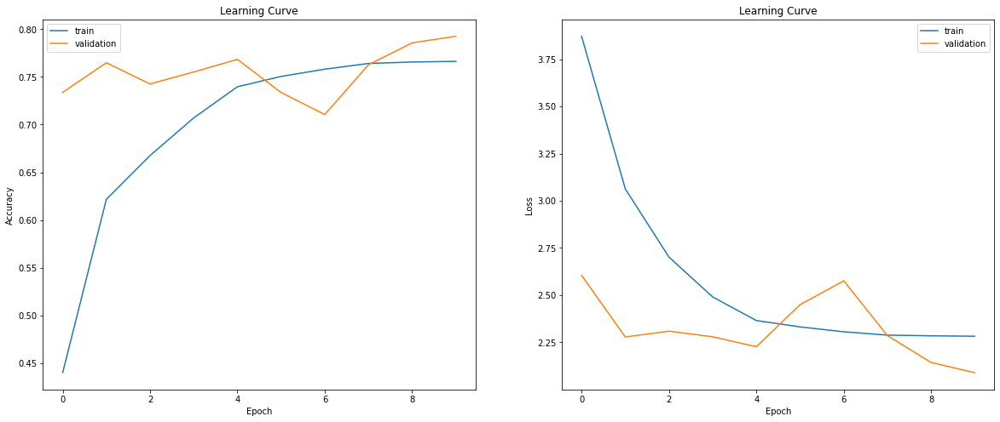

In [ ]:
draw_learning_curve(history)

In [ ]:
model_filename = 'global_attention_inceptonv3_encoder_decoder.h5'
model_save = os.path.join(work_dir , model_filename)
model1 = tf.keras.Model(inputs = [image1,image2,caption], outputs = output)
model1.load_weights(model_save)

In [ ]:
# Load the TensorBoard notebook extension to see different execution trails for keras tuner.
%load_ext tensorboard
%tensorboard --logdir /tmp/tb_logs/inceptonv3

<IPython.core.display.Javascript object>

## Performance

In [ ]:
train_loss, train_acc = model.evaluate(train_dataloader)
val_loss, val_acc = model.evaluate(val_dataloader)
test_loss, test_acc = model.evaluate(test_dataloader)

print('train set accuracy for Inceptionv3 Encoder Decoder model: ', train_acc * 100)
print('validation set accuracy for Inceptionv3 Encoder Decoder model: ', val_acc * 100)
print('test set accuracy for Inceptionv3 Encoder Decoder model : ', test_acc * 100)

5/5 [==============================] - 196s 48s/step - loss: 2.1365 - accuracy: 0.7849
train set accuracy for Inceptionv3 Encoder Decoder model:  75.65740942955017
validation set accuracy for Inceptionv3 Encoder Decoder model:  79.3250024318695
test set accuracy for Inceptionv3 Encoder Decoder model :  78.48666906356812


In [ ]:
# record the metrics for experiment 1
Exp = "Experiment 1"
Model = "Inceptionv3 Encoder Decoder"
results = pd.DataFrame(columns = ['Exp_No', 'Model','Train-accuracy','val-accuracy', 'Test-Accuracy','Train-loss','val-loss', 'Test-loss'])
row = [Exp, Model, train_acc, val_acc, test_acc, train_loss, val_loss, test_loss]
results = results.append(pd.DataFrame([row], columns=results.columns), ignore_index=True)

In [ ]:
results

,Exp_No,Model,Train-accuracy,val-accuracy,Test-Accuracy,Train-loss,val-loss,Test-loss
0,Experiment 1,Inceptionv3 Encoder Decoder,0.756574,0.79325,0.784867,2.349977,2.100315,2.13646


##Greedy Search

In [ ]:
def greedy_search_predict(image1,image2,model = model1):
  """
  Given paths to two x-ray images predicts the impression part of the x-ray in a greedy search algorithm
  """
  image1 = cv2.imread(image1,cv2.IMREAD_UNCHANGED)/255 
  image2 = cv2.imread(image2,cv2.IMREAD_UNCHANGED)/255
  image1 = tf.expand_dims(cv2.resize(image1,input_size,interpolation = cv2.INTER_NEAREST),axis=0) #introduce batch and resize
  image2 = tf.expand_dims(cv2.resize(image2,input_size,interpolation = cv2.INTER_NEAREST),axis=0)
  image1 = model.get_layer('image_encoder')(image1)
  image2 = model.get_layer('image_encoder')(image2)
  image1 = model.get_layer('bkdense')(image1)
  image2 = model.get_layer('bkdense')(image2)

  concat = model.get_layer('concatenate_2')([image1,image2])
  enc_op = model.get_layer('encoder_batch_norm')(concat)  
  enc_op = model.get_layer('encoder_dropout')(enc_op) #this is the output from encoder


  decoder_h,decoder_c = tf.zeros_like(enc_op[:,0]),tf.zeros_like(enc_op[:,0])
  a = []
  pred = []
  for i in range(max_pad):
    if i==0: #if first word
      caption = np.array(tokenizer.texts_to_sequences(['<cls>'])) #shape: (1,1)
    output,decoder_h,attention_weights = model.get_layer('decoder').onestepdecoder(caption,enc_op,decoder_h)#,decoder_c) decoder_c,

    #prediction
    max_prob = tf.argmax(output,axis=-1)  #tf.Tensor of shape = (1,1)
    caption = np.array([max_prob]) #will be sent to onstepdecoder for next iteration
    if max_prob==np.squeeze(tokenizer.texts_to_sequences(['<end>'])): 
      break;
    else:
      a.append(tf.squeeze(max_prob).numpy())
  return tokenizer.sequences_to_texts([a])[0] #here output would be 1,1 so subscripting to open the array

In [ ]:
%%time
k = -2
image1,image2 = test_data.image_1.iloc[k],test_data.image_2.iloc[k]
print(greedy_search_predict(image1,image2,model1))

no acute cardiopulmonary abnormality identified .
CPU times: user 2.1 s, sys: 150 ms, total: 2.25 s
Wall time: 1.44 s


In [ ]:
# Given a reference and prediction string, outputs the 1-gram,2-gram,3-gram and 4-gram bleu scores
def get_bleu(reference,prediction):
  reference = [reference.split()] #should be in an array (cos of multiple references can be there here only 1)
  prediction = prediction.split()
  bleu1 = sentence_bleu(reference,prediction,weights = (1,0,0,0))
  bleu2 = sentence_bleu(reference,prediction,weights = (0.5,0.5,0,0))
  bleu3 = sentence_bleu(reference,prediction,weights = (0.33,0.33,0.33,0))
  bleu4 = sentence_bleu(reference,prediction,weights = (0.25,0.25,0.25,0.25))

  return bleu1,bleu2,bleu3,bleu4

In [ ]:
#calculate mean bleu scores for every datapoint
def mean_bleu(test,predict,model=model1,**kwargs):
  if kwargs!=None:
    top_k = kwargs.get('top_k')
  else:
    top_k = None
  bleu1,bleu2,bleu3,bleu4 = [],[],[],[]
  for index,data in test.iterrows():
    if top_k==None:
      predict_val = predict(data['image_1'],data['image_2'],model = model) #predicted sentence
    else:
      predict_val = predict(data['image_1'],data['image_2'],model = model,top_k = top_k)
    true = data.impression
    _ = get_bleu(true,predict_val)
    bleu1.append(_[0])
    bleu2.append(_[1])
    bleu3.append(_[2])
    bleu4.append(_[3])
  return np.array(bleu1).mean(),np.array(bleu2).mean(),np.array(bleu3).mean(),np.array(bleu4).mean()

In [ ]:
%%time
_ = mean_bleu(test_data,greedy_search_predict)

CPU times: user 10min 15s, sys: 57.2 s, total: 11min 12s
Wall time: 4min 10s


In [ ]:
k = list(_)
index = 'greedy search'
result = pd.DataFrame([k],columns = ["bleu1","bleu2","bleu3","bleu4"],index = [index])
result

,bleu1,bleu2,bleu3,bleu4
greedy search,0.295754,0.295368,0.327149,0.363139


## Beam Search

In [ ]:
def encoder_op(image1,image2,model = model1):
  """
  Given image1 and image2 filepath, outputs
  their backbone features which will be input
  to the decoder
  """
  image1 = cv2.imread(image1,cv2.IMREAD_UNCHANGED)/255 
  image2 = cv2.imread(image2,cv2.IMREAD_UNCHANGED)/255 
  image1 = tf.expand_dims(cv2.resize(image1,input_size,interpolation = cv2.INTER_NEAREST),axis=0) #introduce batch and resize
  image2 = tf.expand_dims(cv2.resize(image2,input_size,interpolation = cv2.INTER_NEAREST),axis=0)
  
  image1 = model.get_layer('image_encoder')(image1) #output from chexnet
  image1 = model.get_layer('bkdense')(image1)
  image2 = model.get_layer('image_encoder')(image2)
  image2 = model.get_layer('bkdense')(image2)

  concat = model.get_layer('concatenate_2')([image1,image2])
  concat = model.get_layer('encoder_batch_norm')(concat)
  concat = model.get_layer('encoder_dropout')(concat)
  return concat

In [ ]:
def beam_search_predict(image1,image2,top_k=3,max_pad = max_pad,model = model1):
  """
  Given image1, image2 get the top
  beam search predicted sentence
  """
  k = top_k
  cls_token = tokenizer.texts_to_sequences(['<cls>'])[0] #[3]
  enc_op = encoder_op(image1,image2)
  states = tf.zeros_like(enc_op[:,0]) #state_h only
  seq_score = [[cls_token,0,states]] #[[[3], 0]]
  finished_seq_score = []
  for i in range(max_pad): #traverse through all lengths
    all_candidates = [] #stores all the top k seq along with their scores
    new_seq_score = [] #stores the seq_score which does not have <end> in them
    for s in seq_score: #traverse for all top k sequences
      text_input = s[0][-1] #getting the last predicted output
      states = s[2]
      caption = np.array([[text_input]]) #ip must be in shape (batch_size,seq length,dim)
      output,states,attention_weights =  model.get_layer('decoder').onestepdecoder(caption,enc_op,states) #here output has shape (1,vocab_size)
      top_words = tf.argsort(output[0],direction = 'DESCENDING')[:k] #get the top k words

      seq,score,_ = s
      for t in top_words.numpy():
        #here we will update score with log of probabilities and subtracting(log of prob will be in negative)
        #here since its -(log), lower the score higher the prob
        candidates = [seq+[t],score-np.log(output[0][t].numpy()),states] #updating the score and seq
        all_candidates.append(candidates)
      seq_score = sorted(all_candidates,key = lambda l:l[1])[:k] #getting the top 3 sentences with high prob ie low score
      #checks for  <end> in each seq obtained
      count = 0
      end_token = tokenizer.word_index['<end>']
      for seq,score,state in seq_score:
        # print('seq,score',seq,score)
        if seq[-1] == end_token: #if last word of the seq is <end>
          finished_seq_score.append([seq,score])
          count+=1
        else:
          new_seq_score.append([seq,score,state])
      k-=count #substracting the no. of finished sentences from beam length
      seq_score = new_seq_score

      if seq_score==[]: #if null array
        break;
      else:
        continue;

  seq_score = finished_seq_score[-1]
  sentence = seq_score[0][1:-1] #here <cls> and <end> is here so not considering that
  score = seq_score[1]
      
  return tokenizer.sequences_to_texts([sentence])[0]

In [ ]:
%%time
k = -1
image1,image2 = test_data.image_1.iloc[k],test_data.image_2.iloc[k]
print(beam_search_predict(image1,image2))

no acute cardiopulmonary abnormality .
CPU times: user 3.87 s, sys: 296 ms, total: 4.17 s
Wall time: 2.49 s


In [ ]:
result

##Prediction

In [ ]:
%%time
test_data['bleu_1_gs'] = np.zeros(test_data.shape[0]) #greedy search
test_data['prediction_gs'] = np.zeros(test_data.shape[0]) #greedy search

for index,rows in test_data.iterrows():
  #greedy search
  predicted_text = greedy_search_predict(rows.image_1,rows.image_2,model1)
  test_data.loc[index,'prediction_gs'] = predicted_text
  reference = [rows['impression'].split()]
  test_data.loc[index,'bleu_1_gs'] = sentence_bleu(reference,predicted_text.split(),weights = (1,0,0,0))

CPU times: user 10min 14s, sys: 57 s, total: 11min 11s
Wall time: 3min 41s


In [ ]:
test_data['prediction_gs'].value_counts()*100/test_data.shape[0] #greedy search

no acute cardiopulmonary abnormality .                                                                          59.680284
low lung volumes with no acute cardiopulmonary abnormality .                                                    10.301954
stable cardiomegaly without acute cardiopulmonary abnormality .                                                  3.730018
cardiomegaly . no acute cardiopulmonary abnormality .                                                            2.664298
no acute cardiopulmonary abnormalities .                                                                         2.309059
                                                                                                                  ...    
hypoinflation cardiomegaly with no acute cardiopulmonary abnormality identified .                                0.177620
hypoinflation with mild cardiomegaly cardiomegaly .                                                              0.177620
cardiomegaly cardiomegal

In [ ]:
def final_caption_pred(image1,image2,method = "beam",top_k = 3,model=model1):
  """
  Given image1. image2 paths, the model, top_k and the method of prediction returns the predicted caption
  method: "greedy" or "g" for greedy search, "beam" or "b" for beam search
  """
  if method in ['greedy','g']:
    pred_caption = greedy_search_predict(image1,image2,model)
  elif method in ['beam','b']:
    pred_caption = beam_search_predict(image1,image2,top_k = top_k,model = model)
  else:
    print("Enter 'b' or 'beam' for beam search and 'g' or 'greedy' for greedy search")
  
  return pred_caption

In [ ]:
def inference(image1,image2,true_caption,model=model1,top_k = None,image_size = (10,20)):
  """
  given 2 images (their paths), the true caption, the model and the range of top_k
  prints the two images, true caption along with greedy search prediction and beam search prediction of top_k range
  """
  image1_array = cv2.imread(image1,cv2.IMREAD_UNCHANGED)
  image2_array = cv2.imread(image2,cv2.IMREAD_UNCHANGED)
  if type(top_k)==int:
    top_k = [top_k] #changing it to list if top_k given is of int type
  greedy_caption = final_caption_pred(image1,image2,method='g',model=model) #getting the greedy search prediction

  #printing the 2 images
  plt.figure(figsize = image_size)
  plt.subplot(121)
  plt.imshow(image1_array)
  plt.axis("off")

  plt.subplot(122)
  plt.imshow(image2_array)
  plt.axis("off")
  plt.show()

  print("\nTrue caption: '%s'"%(true_caption))
  print("Predicted caption(greedy search): '%s'"%(greedy_caption))
  #beam search of top_k
  if top_k != None:
    for i in top_k:
      beam_caption = final_caption_pred(image1,image2,method='b',model=model,top_k = i)
      print("Predicted caption(beam search = %i): '%s'"%(i,beam_caption))


## Correct Caption

In [ ]:
test_data['bleu_1_gs']

0      0.654985
1      1.000000
2      0.428571
3      0.400000
4      0.600000
         ...   
558    0.179732
559    0.021836
560    0.398073
561    0.256709
562    0.200000
Name: bleu_1_gs, Length: 563, dtype: float64

1 )


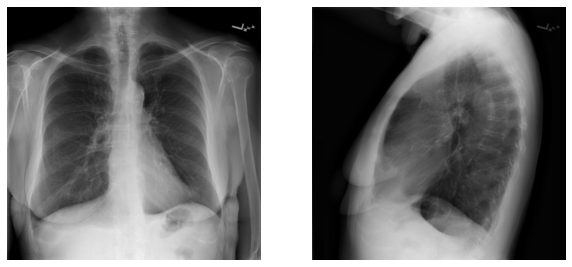


True caption: 'moderately hyperinflated lung otherwise no acute cardiopulmonary abnormality .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


2 )


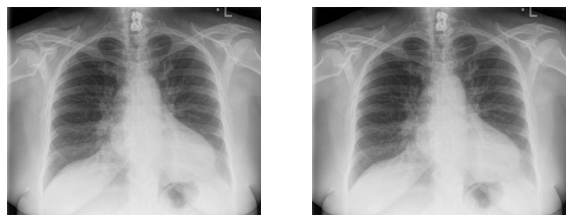


True caption: 'no acute cardiopulmonary process .'
Predicted caption(greedy search): 'stable cardiomegaly without acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'stable cardiomegaly without acute cardiopulmonary abnormality .'


3 )


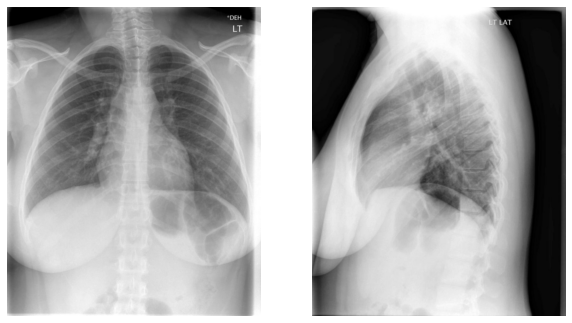


True caption: 'no acute cardiopulmonary abnormality .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


4 )


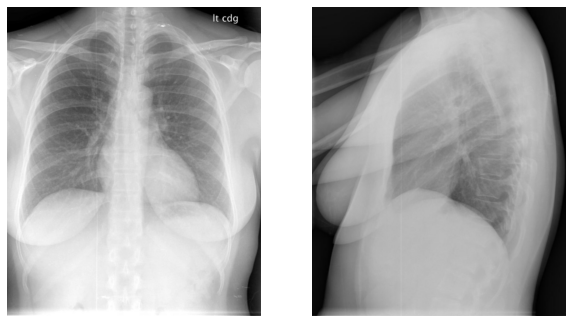


True caption: 'no acute disease .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


5 )


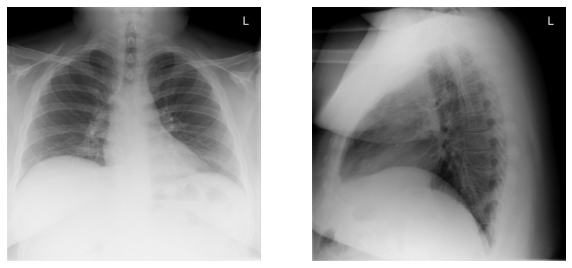


True caption: 'no acute cardiopulmonary findings .'
Predicted caption(greedy search): 'low lung volumes with no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'low lung volumes with no acute cardiopulmonary abnormality .'




In [ ]:
i = test_data[(test_data['bleu_1_gs']>0.3)].sample(5).index
for j,k in enumerate(i):
  print(j+1,")")
  image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
  true_caption = test_data['impression'][k]
  inference(image1,image2,true_caption,top_k = 1)
  print("\n")

1 )


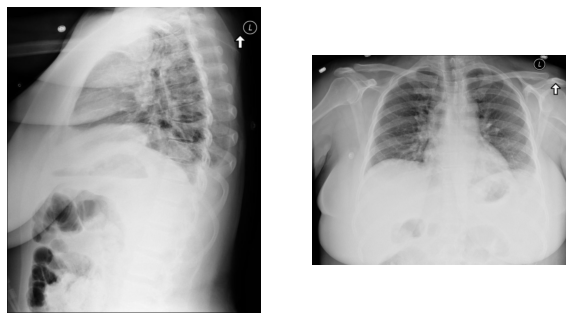


True caption: 'patchy opacity left base may represent evolving infiltrate . small right pleural effusion .'
Predicted caption(greedy search): 'low lung volumes with right basilar airspace disease .'
Predicted caption(beam search = 1): 'low lung volumes with right basilar airspace disease .'


2 )


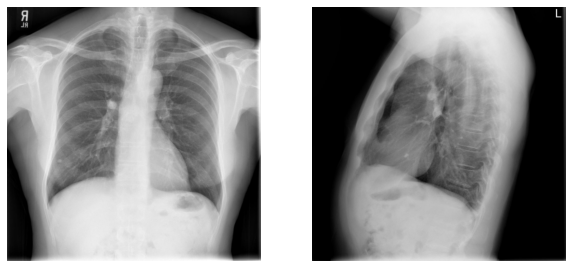


True caption: 'cm nodule within the lung base seen only on the lateral view . consider imaging correlation with abdomen study if available .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


3 )


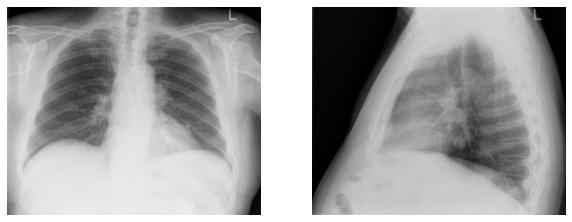


True caption: 'calcified granulomas . no suspicious appearing lung nodules identified . well expanded and clear lungs . mediastinal contour within normal limits . no acute cardiopulmonary abnormality identified .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


4 )


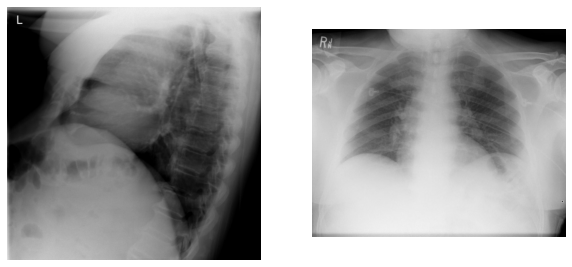


True caption: 'no acute cardiopulmonary abnormality . mild nonspecific prominence of mediastinum consider repeat cr if any concern for vascular process .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


5 )


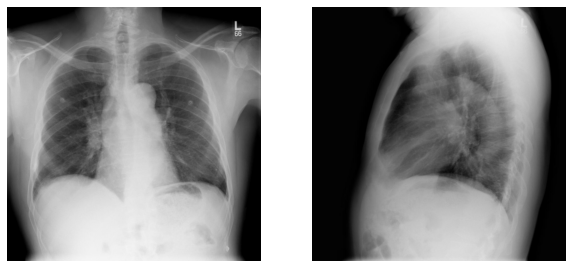


True caption: 'no acute pulmonary abnormality . abnormal appearance of the mediastinum as discussed below .'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormalities .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormalities .'




In [ ]:
i = test_data[test_data['bleu_1_gs']<=0.3].sample(5).index
for j,k in enumerate(i):
  print(j+1,")")
  image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
  true_caption = test_data['impression'][k]
  inference(image1,image2,true_caption,top_k = 1)
  print("\n")

##Random Comparision

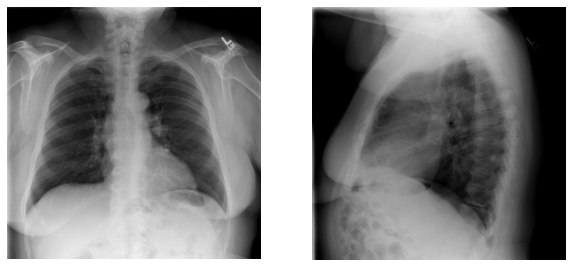


True caption: 'no acute findings'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'no acute cardiopulmonary abnormality .'


In [ ]:
k = 3
image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
true_caption = test_data['impression'][k]
inference(image1,image2,true_caption,top_k=1)

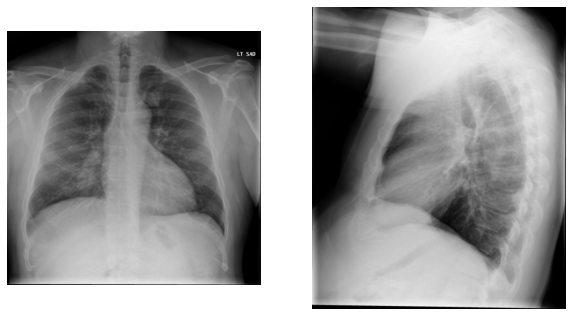


True caption: 'the heart size is normal . there is minimal fibronodular scarring right apex otherwise lungs clear'
Predicted caption(greedy search): 'low lung volumes with no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'low lung volumes with no acute cardiopulmonary abnormality .'


In [ ]:
k = 456
image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
true_caption = test_data['impression'][k]
inference(image1,image2,true_caption,top_k=1)

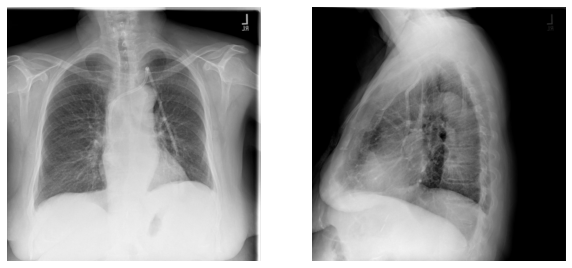


True caption: 'elevated left hemidiaphragm . no evidence of active disease .'
Predicted caption(greedy search): 'low lung volumes with no acute cardiopulmonary abnormality .'
Predicted caption(beam search = 1): 'low lung volumes with no acute cardiopulmonary abnormality .'


In [ ]:
k = 350
image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
true_caption = test_data['impression'][k]
inference(image1,image2,true_caption,top_k=1)

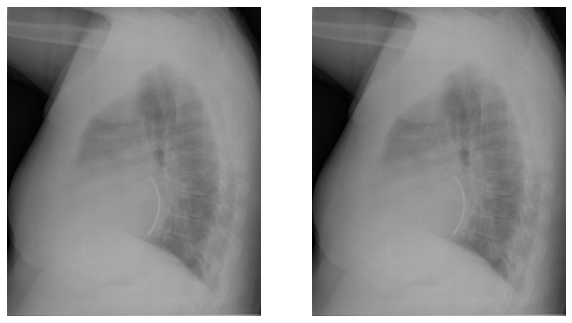


True caption: 'cardiomegaly with central pulmonary vascular congestion and no acute cardiopulmonary findings .'
Predicted caption(greedy search): 'low lung volumes with mild central vascular congestion .'
Predicted caption(beam search = 1): 'low lung volumes with mild central vascular congestion .'


In [ ]:
k = 560
image1,image2 = test_data['image_1'][k],test_data['image_2'][k]
true_caption = test_data['impression'][k]
inference(image1,image2,true_caption,top_k=1)

In [ ]:
random_image = work_dir + 'data/pneumonia dataset/person100_bacteria_475.jpeg'
true_caption = 'pneumonia detected'

random_image = Image.open(random_image).convert('RGB')
random_image.save("person100_bacteria_475_RGB.jpeg")

(762, 1106, 3)


<Figure size 720x1440 with 0 Axes>

(-0.5, 1105.5, 761.5, -0.5)

(-0.5, 1105.5, 761.5, -0.5)

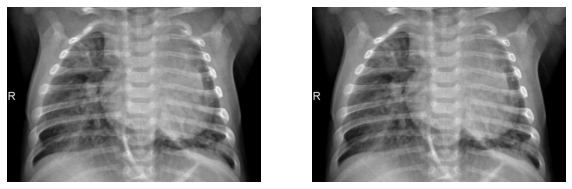


True caption: 'pneumonia detected'
Predicted caption(greedy search): 'no acute cardiopulmonary abnormality identified .'


In [ ]:
random_image = work_dir + 'person100_bacteria_475_RGB.jpeg'
true_caption = 'pneumonia detected'

random_image_array = cv2.imread(random_image,cv2.IMREAD_UNCHANGED)
print(random_image_array.shape)
greedy_caption = final_caption_pred(random_image,random_image,method='g',model=model) #getting the greedy search prediction

#printing the 2 images
plt.figure(figsize = (10,20))
plt.subplot(121)
plt.imshow(random_image_array)
plt.axis("off")

plt.subplot(122)
plt.imshow(random_image_array)
plt.axis("off")
plt.show()

print("\nTrue caption: '%s'"%(true_caption))
print("Predicted caption(greedy search): '%s'"%(greedy_caption))